In [3]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import numpy as np
import xgboost as xgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, precision_recall_curve, roc_curve, auc, f1_score
from sklearn.model_selection import cross_val_predict, StratifiedKFold
sc.set_figure_params(dpi=100, dpi_save=300, frameon=False, )
import shutup; shutup.please()

In [4]:
adata = sc.read_h5ad(('/home/aih/shrey.parikh/PDAC/PDAC/Classifier/scpoli_donor_final_integration.h5ad'))


In [5]:
adata.obs = adata.obs.replace('nan', np.nan)

In [6]:
adata.obs['Label_Harmonized_Merged'] = adata.obs['Label_Harmonized']

In [7]:
adata.obs = adata.obs.astype(str)

In [8]:
adata.obs_names_make_unique()

In [9]:
adata.obs.loc[adata.obs['Label_Harmonized_Merged'] == 'Unknown', 'Label_Harmonized_Merged'] = adata.obs['Label_Harmonized_Ding']

In [21]:
adata.obs.groupby(['Label_Harmonized_Merged', 'Dataset']).size().unstack()

Dataset,Caronni,Ding,Lee,Moncada,Peng,Regev,Schlesinger,Simeone,Steele,Zenodo_OUGS,Zhang
Label_Harmonized_Merged,,,,,,,,,,,
Acinar cell,NaN,290.0,NaN,14.0,502.0,NaN,11.0,NaN,NaN,4.0,NaN
Adipocyte,NaN,NaN,NaN,NaN,NaN,430.0,NaN,NaN,NaN,NaN,NaN
B cell,NaN,11078.0,NaN,NaN,2416.0,1725.0,7.0,NaN,NaN,2362.0,NaN
CAF,NaN,19461.0,NaN,NaN,NaN,47663.0,NaN,NaN,NaN,NaN,NaN
Ductal Cell,NaN,1433.0,NaN,3146.0,13953.0,NaN,2244.0,NaN,NaN,858.0,NaN
Endocrine Cell,NaN,593.0,NaN,12.0,458.0,8269.0,6.0,NaN,NaN,296.0,NaN
Endothelial Cell,NaN,8718.0,NaN,161.0,5134.0,15818.0,50.0,NaN,NaN,16.0,NaN
Epithelial,NaN,887.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Epithelial Cell,NaN,NaN,NaN,NaN,NaN,32097.0,NaN,NaN,NaN,NaN,NaN


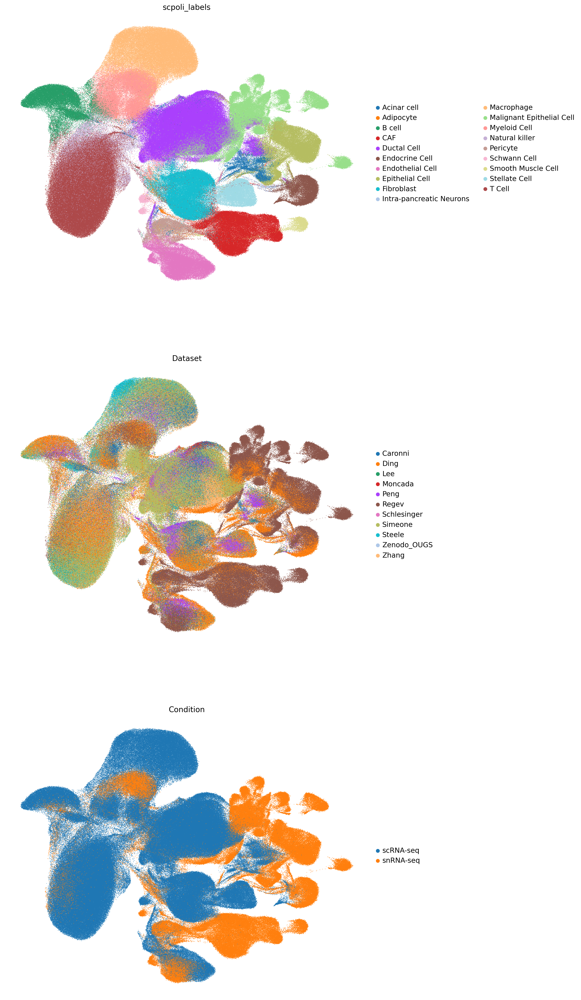

In [35]:
random_indices = np.random.permutation(list(range(adata.shape[0])))
sc.pl.umap(adata[random_indices,:], color=['scpoli_labels', 'Dataset', 'Condition'], ncols=1, size=3)

In [12]:
datasets = ['Regev', 'Moncada', 'Schlesinger', 'Zenodo_OUGS', 'Ding', 'Peng']

In [13]:
adata.obs = adata.obs.astype('category')

In [14]:
adata_labeled = adata[adata.obs.Dataset.isin(datasets)]
adata_unlabeled = adata[~adata.obs.Dataset.isin(datasets)]

In [15]:
adata_labeled.obs.groupby('Malignant_Classification').size()

Malignant_Classification
Malignant         69088
Non-Malignant    395855
dtype: int64

In [16]:
random_indices = np.random.permutation(list(range(adata_labeled.shape[0])))
adata_labeled_umap = adata_labeled[random_indices, :]

In [17]:
adata_labeled_umap.obs = adata_labeled_umap.obs.replace('nan', np.nan)  

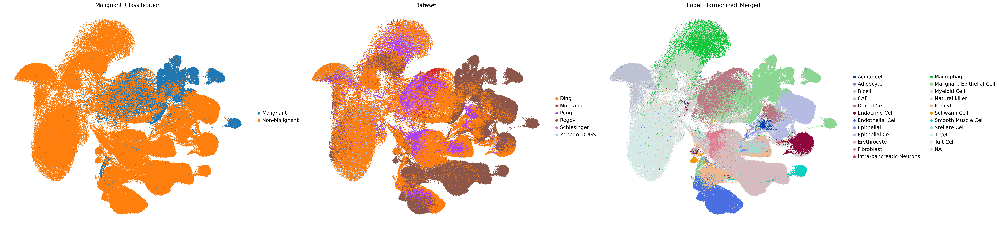

In [33]:
plt.rcParams['figure.figsize'] = [12, 10]
sc.pl.umap(adata_labeled_umap, color=['Malignant_Classification', "Dataset", 'Label_Harmonized_Merged'], size=10)

# Try with embedding

In [10]:
X = adata_labeled.obsm['X_emb']
Y = adata_labeled.obs['Malignant_Classification']
Y = Y.map({'Malignant': 1, 'Non-Malignant': 0})
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.20, random_state=42)

NameError: name 'adata_labeled' is not defined

In [77]:
# Convert to anndata objects
# adata_train = adata[y_train.index, :]
# adata_test = adata[y_test.index, :]

In [11]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

NameError: name 'X_train' is not defined

In [45]:
# model = xgb.XGBClassifier()
# model.fit(X_train, y_train)

# # y_pred = model.predict(X_test)
# y_pred_probs = model.predict(X_test)
# y_pred = (y_pred_probs > 0.5).astype(int)



# accuracy = accuracy_score(y_test, y_pred) * 100
# print("Accuracy of the Logistic Regression Model: ",accuracy)

# accuracy = accuracy_score(y_test, y_pred)
# roc_auc = roc_auc_score(y_test, y_pred_probs)

# print(f"Accuracy: {accuracy}")
# print(f"ROC AUC: {roc_auc}")

Accuracy of the Logistic Regression Model:  95.7059437137726
Accuracy: 0.957059437137726
ROC AUC: 0.8972169886390876


In [38]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'max_depth': 5,
    'eta': 0.1,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'use_label_encoder':False# You can also use 'auc' for Area Under Curve
}

num_boost_round = 100
bst = xgb.train(params, dtrain, num_boost_round)

y_pred_probs = bst.predict(dtest)
y_pred = (y_pred_probs > 0.5).astype(int)

accuracy = accuracy_score(y_test, y_pred) * 100
print("Accuracy of the Logistic Regression Model: ",accuracy)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_probs)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("F1 Score:", f1)
print(f"ROC AUC: {roc_auc}")

Accuracy of the Logistic Regression Model:  95.17792427061266
Accuracy: 0.9517792427061266
F1 Score: 0.8246793869252425
ROC AUC: 0.9784546587436296


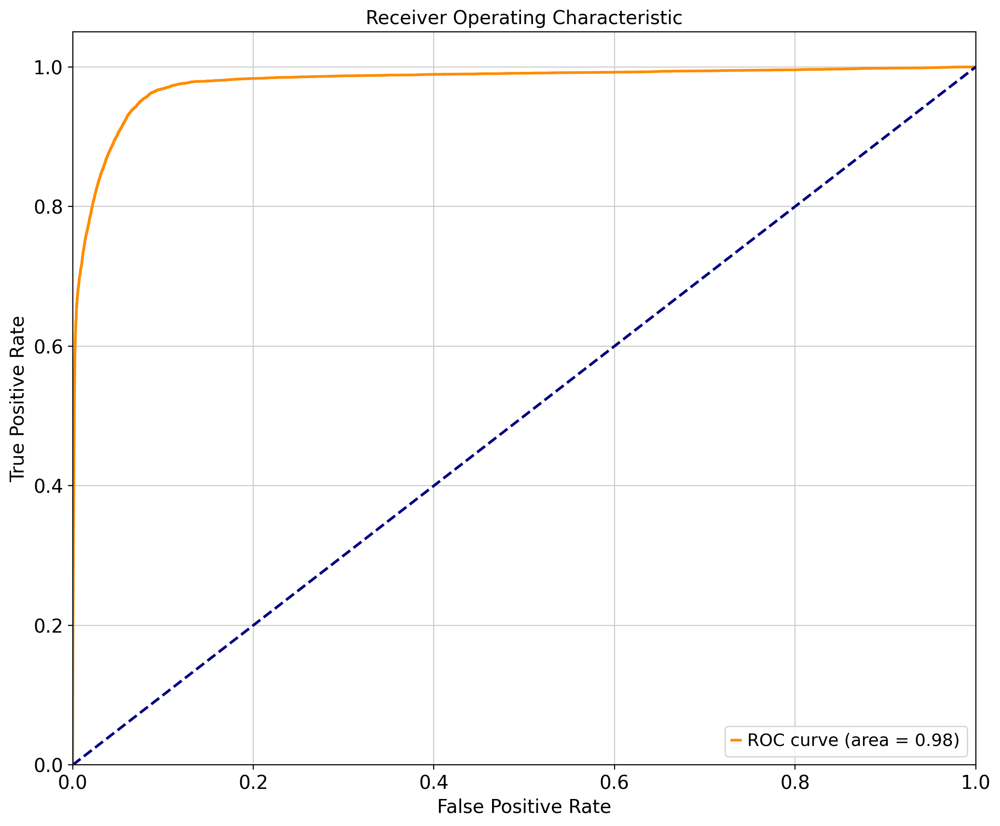

In [40]:
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [56]:
# Precision: It compares the correctly identified malignant cells (true positives) to all the cells that the model classified as malignant (both true positives and false positives). It answers the question: "Of all the cells that were labeled as malignant by the model, how many were actually malignant?"

# Precision
# =
# True Positives (TP)
# True Positives (TP)
# +
# False Positives (FP)
# Precision= 
# True Positives (TP)+False Positives (FP)
# True Positives (TP)
# ​
 

# Recall (Sensitivity): It compares the correctly identified malignant cells (true positives) to all the actual malignant cells in the ground truth (both true positives and false negatives). It answers the question: "Of all the cells that are actually malignant, how many did the model correctly identify as malignant?"

# Recall
# =
# True Positives (TP)
# True Positives (TP)
# +
# False Negatives (FN)
# Recall= 
# True Positives (TP)+False Negatives (FN)
# True Positives (TP)
# ​
 

# So, to summarize:

# Precision is about how accurate the model's positive (malignant) predictions are.
# Recall is about how good the model is at detecting the positive (malignant) cases from all actual positive cases.

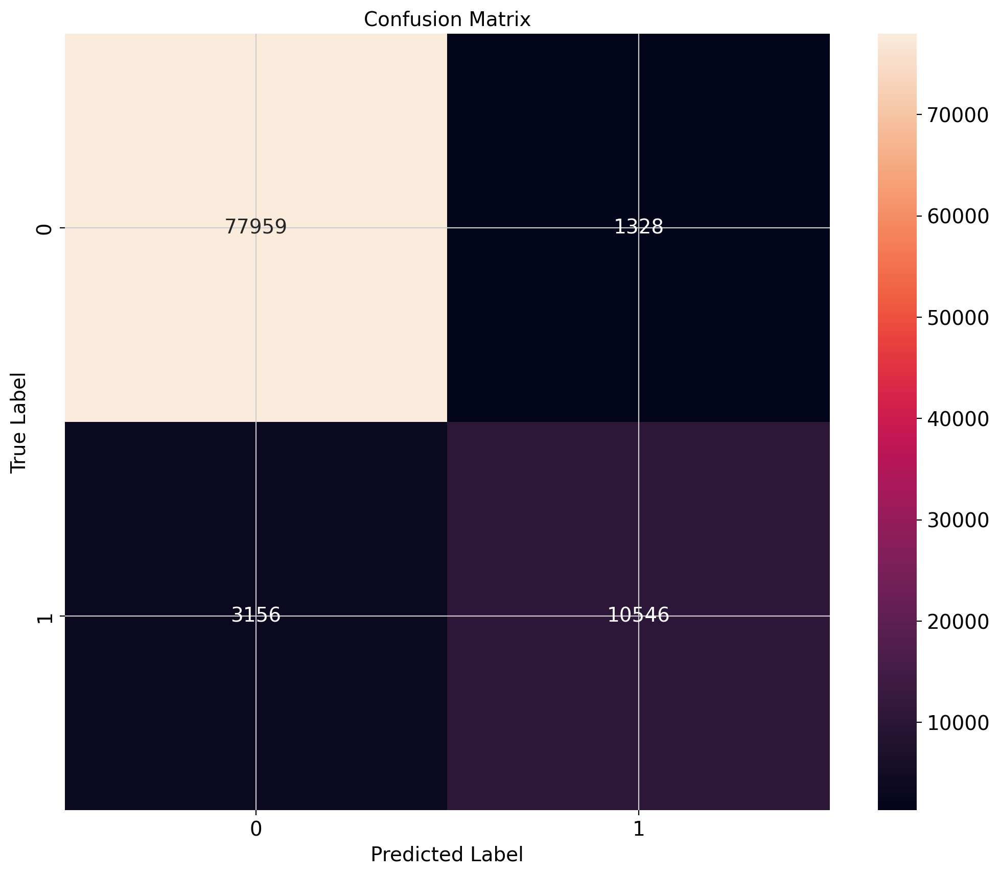

Precision-Recall AUC: 0.9202285135810875


In [41]:
conf_matrix = confusion_matrix(y_test, y_pred)

sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)
pr_auc = auc(recall, precision)
print("Precision-Recall AUC:", pr_auc)

In [42]:
max_depth_values = range(1, 51, 5)  
eta_values = range(0.1, 5, 0.5)
skf = StratifiedKFold(n_splits=20, shuffle=True, random_state=42)
mean_accuracy_scores = []
mean_roc_auc_scores = []
mean_f1_scores = []

for max_depth in max_depth_values:
    accuracy_scores = []
    roc_auc_scores = []
    f1_scores = []
    for train_index, test_index in skf.split(X, Y):
        X_train_fold, X_test_fold = X[train_index], X[test_index]
        y_train_fold, y_test_fold = Y[train_index], Y[test_index]

        dtrain_fold = xgb.DMatrix(X_train_fold, label=y_train_fold)
        dtest_fold = xgb.DMatrix(X_test_fold, label=y_test_fold)

        params['max_depth'] = max_depth
        bst_fold = xgb.train(params, dtrain_fold, num_boost_round)

        y_pred_fold = bst_fold.predict(dtest_fold) > 0.5
        accuracy_scores.append(accuracy_score(y_test_fold, y_pred_fold))
        roc_auc_scores.append(roc_auc_score(y_test_fold, bst_fold.predict(dtest_fold)))
        f1_scores.append(f1_score(y_test_fold, y_pred_fold))

    mean_accuracy_scores.append(np.mean(accuracy_scores))
    mean_roc_auc_scores.append(np.mean(roc_auc_scores))
    mean_f1_scores.append(np.mean(f1_scores))



TypeError: 'float' object cannot be interpreted as an integer

In [41]:
eta_values = np.arange(0.1, 5, 0.5)

In [34]:
mean_f1_scores

[0.7514766663305276,
 0.8359019567572323,
 0.8610935917352698,
 0.8666846898292702,
 0.8674387746588412,
 0.8672840108318309,
 0.8683234941182951,
 0.8681108510239467,
 0.8683702138981267,
 0.8680672067837861]

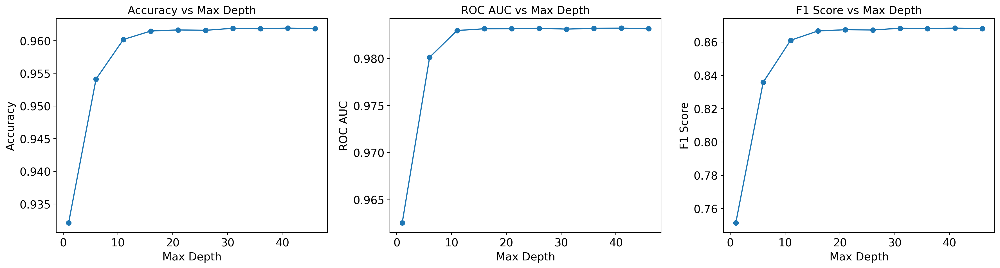

In [35]:

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(max_depth_values, mean_accuracy_scores, marker='o')
plt.title('Accuracy vs Max Depth')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(max_depth_values, mean_roc_auc_scores, marker='o')
plt.title('ROC AUC vs Max Depth')
plt.xlabel('Max Depth')
plt.ylabel('ROC AUC')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(max_depth_values, mean_f1_scores, marker='o')
plt.title('F1 Score vs Max Depth')
plt.xlabel('Max Depth')
plt.ylabel('F1 Score')
plt.grid()


plt.tight_layout()
plt.show()

In [44]:
# max_depth_values = range(1, 51, 5)  
eta_values = np.arange(0.1, 1, 0.2)
skf = StratifiedKFold(n_splits=20, shuffle=True, random_state=42)
mean_accuracy_scores_eta = []
mean_roc_auc_scores_eta = []
mean_f1_scores_eta = []

for eta in eta_values:
    accuracy_scores = []
    roc_auc_scores = []
    f1_scores = []
    for train_index, test_index in skf.split(X, Y):
        X_train_fold, X_test_fold = X[train_index], X[test_index]
        y_train_fold, y_test_fold = Y[train_index], Y[test_index]

        dtrain_fold = xgb.DMatrix(X_train_fold, label=y_train_fold)
        dtest_fold = xgb.DMatrix(X_test_fold, label=y_test_fold)
        params = {
        'max_depth': 20,
        'eta': eta,
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'use_label_encoder':False# You can also use 'auc' for Area Under Curve
        }

        bst_fold = xgb.train(params, dtrain_fold, num_boost_round)

        y_pred_fold = bst_fold.predict(dtest_fold) > 0.5
        accuracy_scores.append(accuracy_score(y_test_fold, y_pred_fold))
        roc_auc_scores.append(roc_auc_score(y_test_fold, bst_fold.predict(dtest_fold)))
        f1_scores.append(f1_score(y_test_fold, y_pred_fold))

    mean_accuracy_scores_eta.append(np.mean(accuracy_scores))
    mean_roc_auc_scores_eta.append(np.mean(roc_auc_scores))
    mean_f1_scores_eta.append(np.mean(f1_scores))



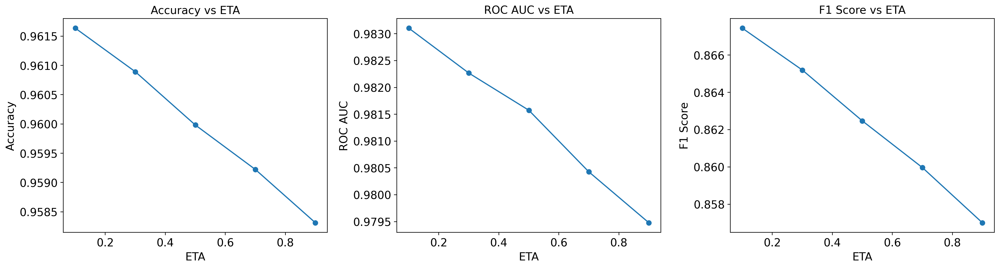

In [45]:

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(eta_values, mean_accuracy_scores_eta, marker='o')
plt.title('Accuracy vs ETA')
plt.xlabel('ETA')
plt.ylabel('Accuracy')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(eta_values, mean_roc_auc_scores_eta, marker='o')
plt.title('ROC AUC vs ETA')
plt.xlabel('ETA')
plt.ylabel('ROC AUC')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(eta_values, mean_f1_scores_eta, marker='o')
plt.title('F1 Score vs ETA')
plt.xlabel('ETA')
plt.ylabel('F1 Score')
plt.grid()


plt.tight_layout()
plt.show()

In [62]:
help(np.arange)

Help on built-in function arange in module numpy:

arange(...)
    arange([start,] stop[, step,], dtype=None, *, like=None)

    Return evenly spaced values within a given interval.

    ``arange`` can be called with a varying number of positional arguments:

    * ``arange(stop)``: Values are generated within the half-open interval
      ``[0, stop)`` (in other words, the interval including `start` but
      excluding `stop`).
    * ``arange(start, stop)``: Values are generated within the half-open
      interval ``[start, stop)``.
    * ``arange(start, stop, step)`` Values are generated within the half-open
      interval ``[start, stop)``, with spacing between values given by
      ``step``.

    For integer arguments the function is roughly equivalent to the Python
    built-in :py:class:`range`, but returns an ndarray rather than a ``range``
    instance.

    When using a non-integer step, such as 0.1, it is often better to use
    `numpy.linspace`.

    See the Warning sections 

In [69]:
len(eta_values)

11

# Try with adata.X

In [18]:
X = adata_labeled.X
Y = adata_labeled.obs['Malignant_Classification']
Y = Y.map({'Malignant': 1, 'Non-Malignant': 0})
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.20, random_state=42)

In [ ]:
# Convert to anndata objects
# adata_train = adata[y_train.index, :]
# adata_test = adata[y_test.index, :]

In [19]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(371954, 3781)
(371954,)
(92989, 3781)
(92989,)


In [21]:
gene_names = adata.var_names.tolist()
dtrain = xgb.DMatrix(X_train, label=y_train, feature_names=gene_names)
dtest = xgb.DMatrix(X_test, label=y_test, feature_names=gene_names)

params = {
    'max_depth': 20,
    'eta': 0.1,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'use_label_encoder':False# You can also use 'auc' for Area Under Curve
}

num_boost_round = 100
bst_X = xgb.train(params, dtrain, num_boost_round)

y_pred_probs = bst_X.predict(dtest)
y_pred = (y_pred_probs > 0.5).astype(int)

accuracy = accuracy_score(y_test, y_pred) * 100
print("Accuracy of the Logistic Regression Model: ",accuracy)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_probs)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("F1 Score:", f1)
print(f"ROC AUC: {roc_auc}")

Accuracy of the Logistic Regression Model:  97.72553742915828
Accuracy: 0.9772553742915828
F1 Score: 0.9222054658476477
ROC AUC: 0.9898728198899873


In [ ]:
# dtrain = xgb.DMatrix(X_train, label=y_train)
# dtest = xgb.DMatrix(X_test, label=y_test)

# params = {
#     'max_depth': 5,
#     'eta': 0.1,
#     'objective': 'binary:logistic',
#     'eval_metric': 'logloss',
#     'use_label_encoder':False# You can also use 'auc' for Area Under Curve
# }

# num_boost_round = 100
# bst = xgb.train(params, dtrain, num_boost_round)

# y_pred_probs = bst.predict(dtest)
# y_pred = (y_pred_probs > 0.5).astype(int)

# accuracy = accuracy_score(y_test, y_pred) * 100
# print("Accuracy of the Logistic Regression Model: ",accuracy)

# accuracy = accuracy_score(y_test, y_pred)
# roc_auc = roc_auc_score(y_test, y_pred_probs)

# print(f"Accuracy: {accuracy}")
# print(f"ROC AUC: {roc_auc}")

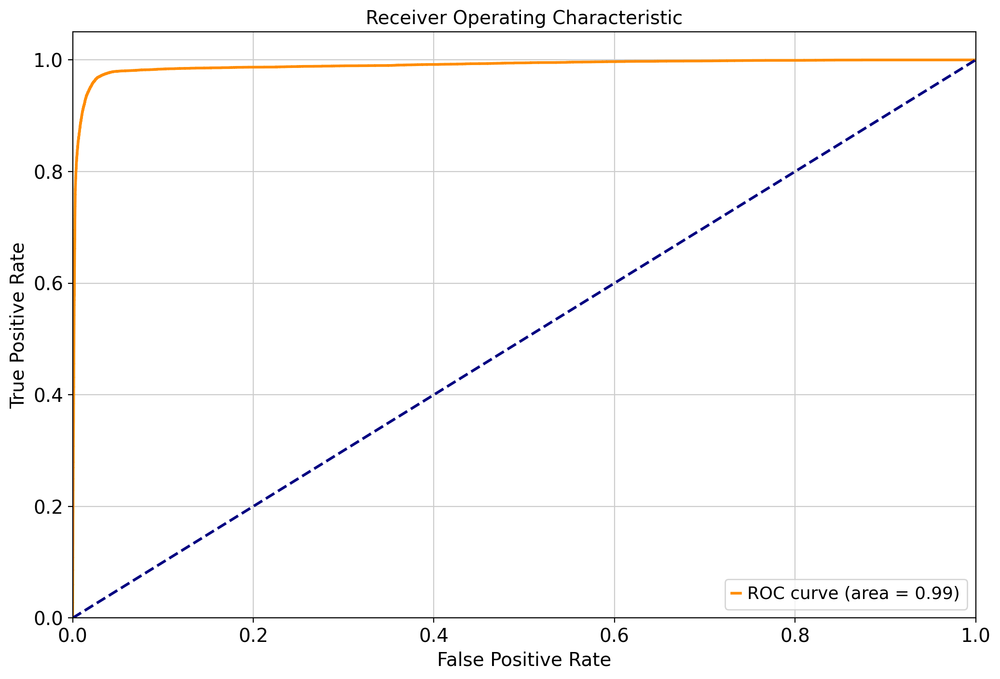

In [22]:
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)
plt.rcParams['figure.figsize'] = [12, 8]
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

plt.show()

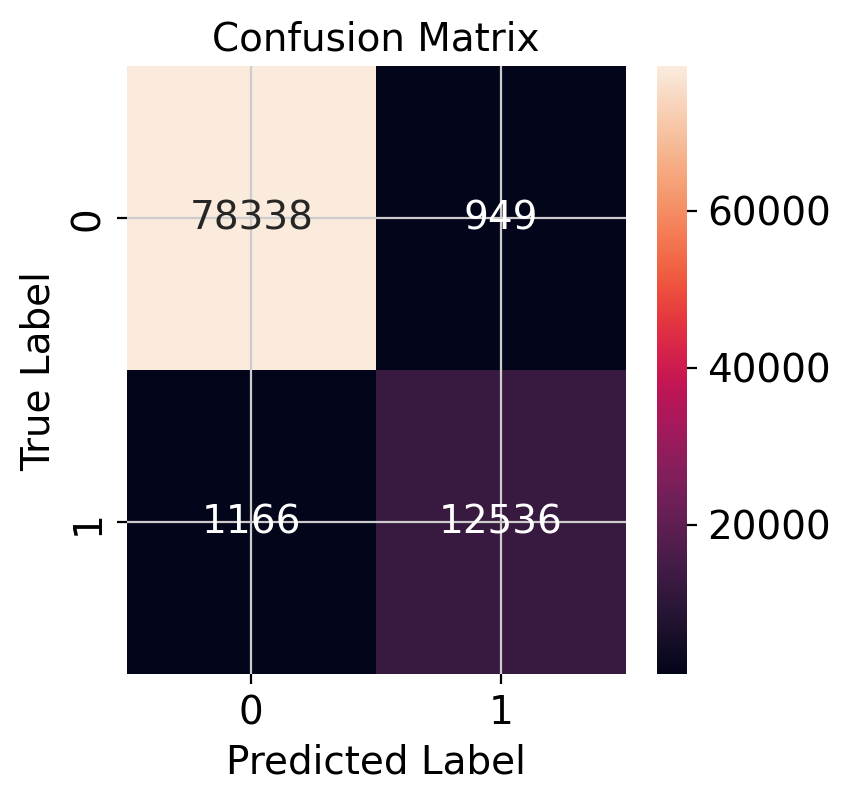

Precision-Recall AUC: 0.962612352305781


In [23]:
plt.rcParams['figure.figsize'] = [4, 4]
conf_matrix = confusion_matrix(y_test, y_pred)

sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)
pr_auc = auc(recall, precision)
print("Precision-Recall AUC:", pr_auc)

In [31]:
bst_X[:1]

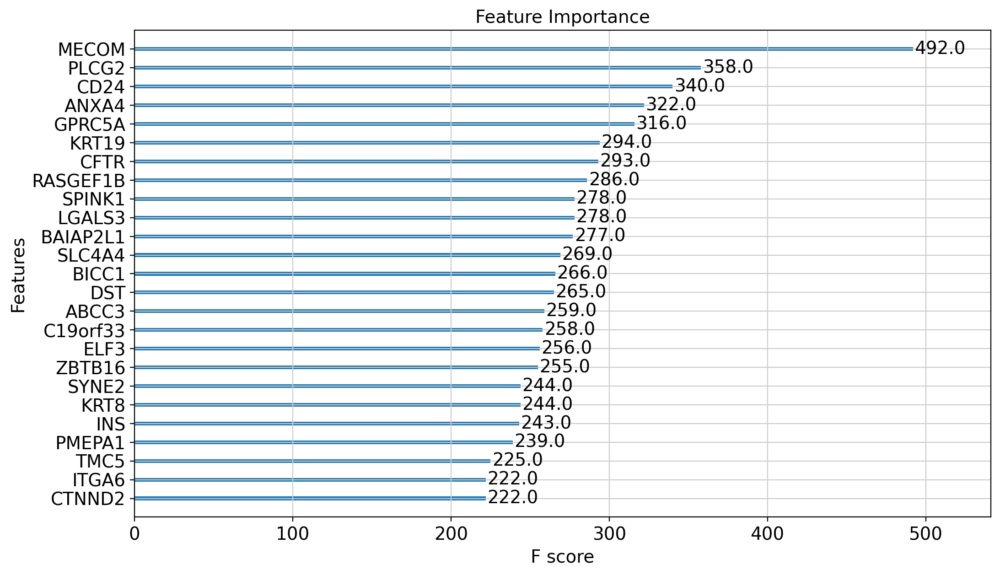

In [37]:
plt.rcParams['figure.figsize'] = [12, 7]
xgb.plot_importance(bst_X,max_num_features=25)
plt.title('Feature Importance')
plt.show()

In [27]:
importance = bst_X.get_score(importance_type='weight')  # Options are 'weight', 'gain', 'cover'

In [28]:
df = pd.DataFrame(importance.items(), columns=['Gene', 'Importance']).sort_values(by='Importance', ascending=False)

In [29]:
df.head(20)

,Gene,Importance
1901,MECOM,492.0
2329,PLCG2,358.0
517,CD24,340.0
210,ANXA4,322.0
1303,GPRC5A,316.0
1688,KRT19,294.0
623,CFTR,293.0
2513,RASGEF1B,286.0
2883,SPINK1,278.0
1732,LGALS3,278.0


<Axes: xlabel='Importance', ylabel='Gene'>

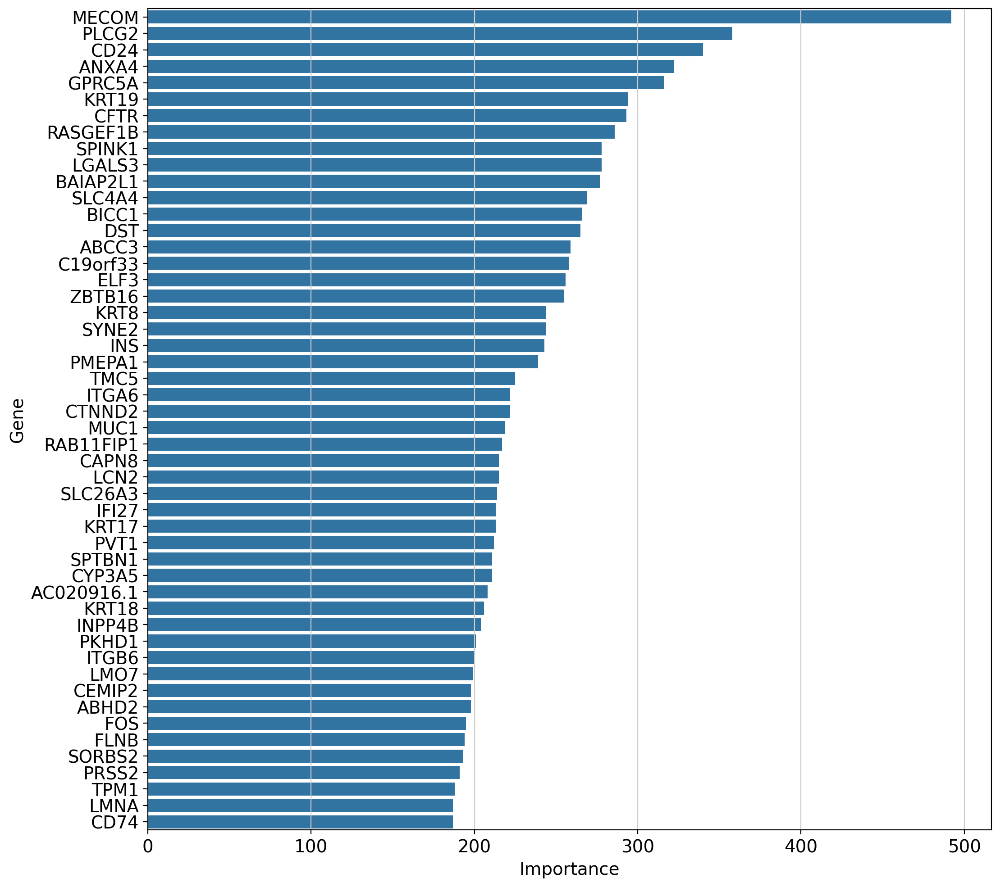

In [30]:
plt.rcParams['figure.figsize'] = [12, 12]
sns.barplot(x='Importance', y='Gene', data=df.head(50), orient='h')

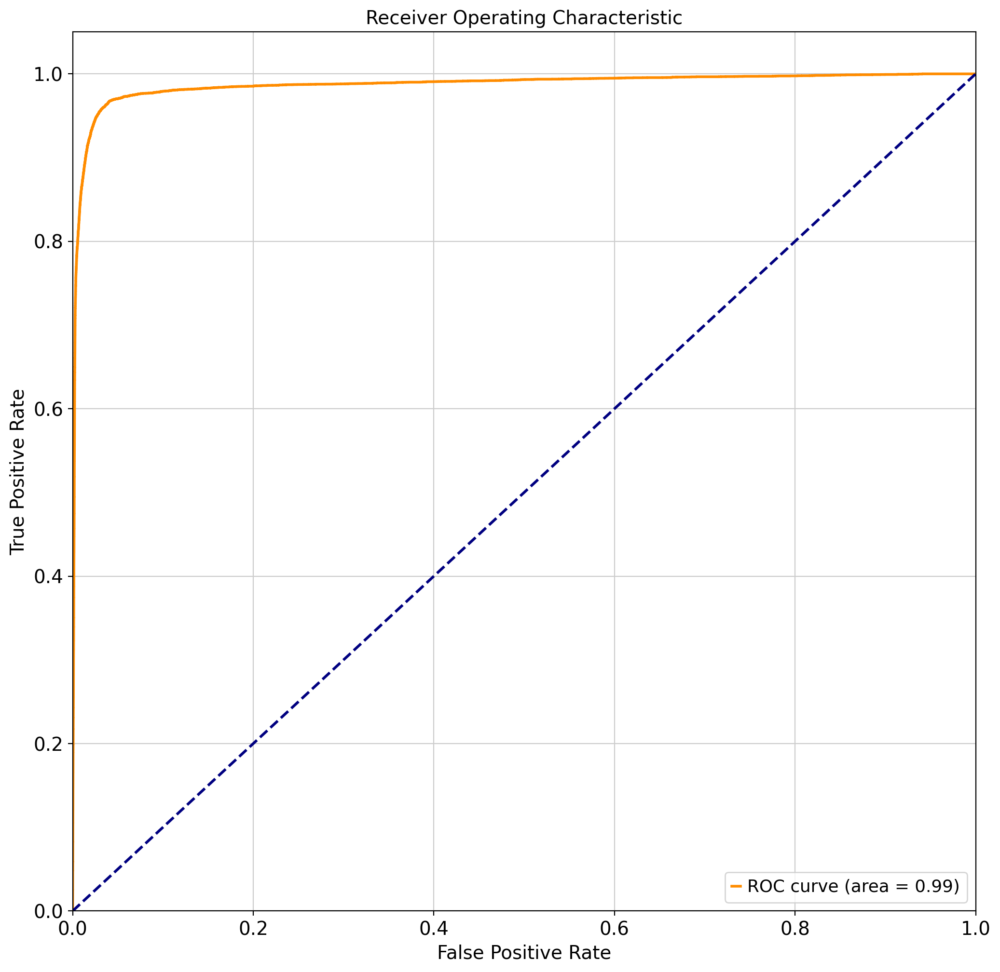

In [60]:
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Max_depth = 20 and ETA=0.10 works best

In [61]:
X = adata_labeled.obsm['X_emb']
Y = adata_labeled.obs['Malignant_Classification']
Y = Y.map({'Malignant': 1, 'Non-Malignant': 0})
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.20, random_state=42)

In [62]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(371954, 10)
(371954,)
(92989, 10)
(92989,)


In [67]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'max_depth': 20,
    'eta': 0.1,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'use_label_encoder':False# You can also use 'auc' for Area Under Curve
}

num_boost_round = 100
bst = xgb.train(params, dtrain, num_boost_round)

y_pred_probs = bst.predict(dtest)
y_pred = (y_pred_probs > 0.5).astype(int)

accuracy = accuracy_score(y_test, y_pred) * 100
print("Accuracy of the Logistic Regression Model: ",accuracy)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_probs)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("F1 Score:", f1)
print(f"ROC AUC: {roc_auc}")

Accuracy of the Logistic Regression Model:  96.20170127649507
Accuracy: 0.9620170127649507
F1 Score: 0.8674174174174174
ROC AUC: 0.9833304097988622


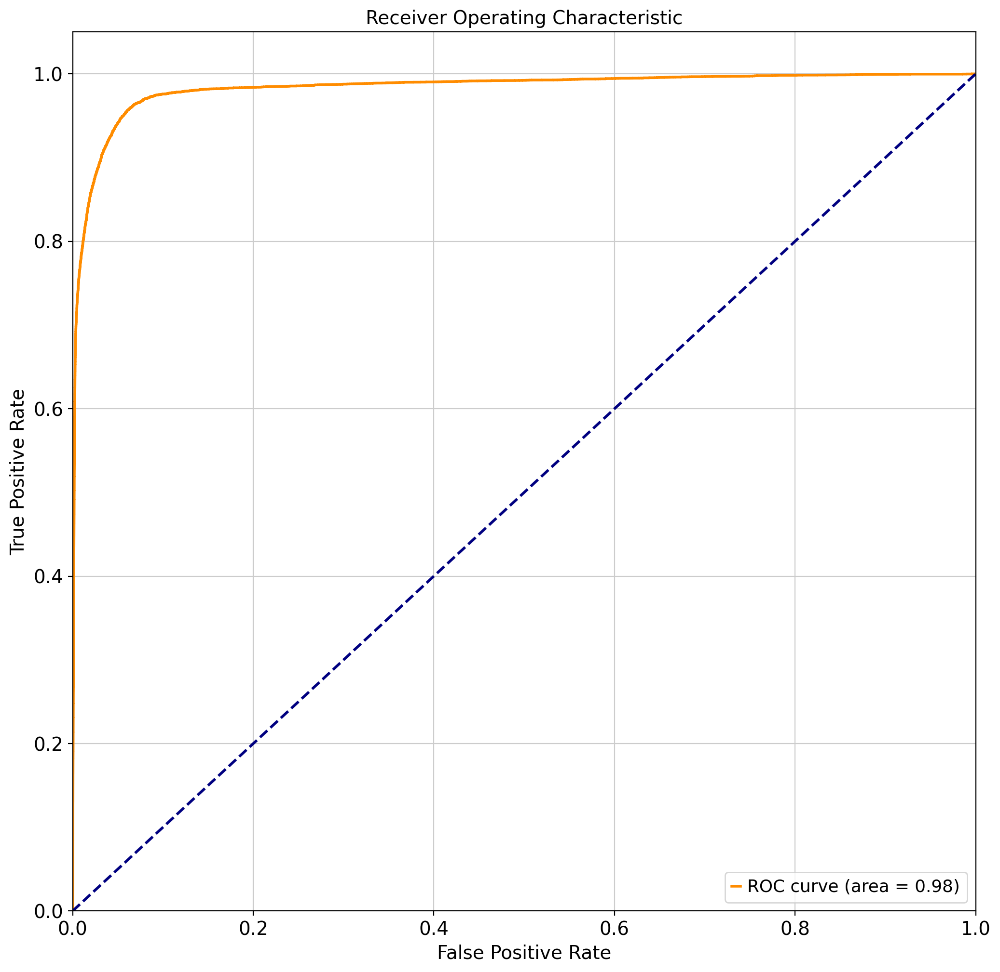

In [68]:
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

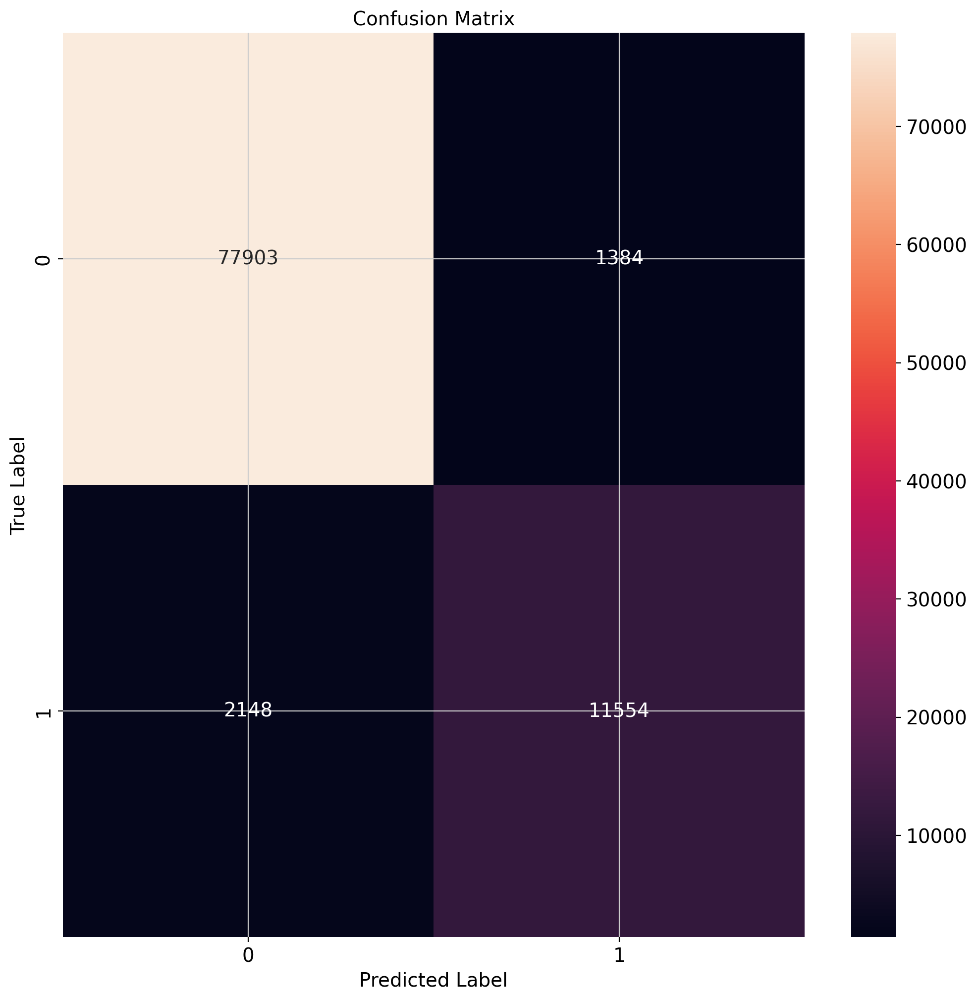

Precision-Recall AUC: 0.9372510526119491


In [69]:
conf_matrix = confusion_matrix(y_test, y_pred)

sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)
pr_auc = auc(recall, precision)
print("Precision-Recall AUC:", pr_auc)

# actual prediction

In [70]:
adata

AnnData object with n_obs × n_vars = 837983 × 3781
    obs: 'Dataset', 'ID', 'pseudo_barcode_two', 'scanvi_labels', 'Label_Harmonized', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'Label_Harmonized_pred', 'Label_Harmonized_uncert', 'query', 'scpoli_labels', 'Condition', 'cell_barcode', 'Level 1 Annotation_Regev', 'Level 2 Annotation_Regev', 'Level 3 Annotation_Regev', 'Cell_type_Peng', 'Malignant Classification_Peng', 'Cell_type_Zenodo_OUGS', 'Malignant Classification_Zenodo_OUGS', 'Cell_type_Moncada', 'Malignant Classification_Moncada', 'Cell_type_Schlesinger', 'Malignant Classification_Schlesinger', 'cell_types_Ding', 'Label_Harmonized_Ding', 'Malignant_Classification_Regev', 'Malignant_Classification_Ding', 'Malignant_Classification', 'Label_Harmonized_Merged'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'neighbors', 'output_type', 'umap', 'scpoli_labels_colors', 'Dataset_

In [71]:
X_full = adata.obsm['X_emb']
dfull = xgb.DMatrix(X_full)

In [72]:
y_full_pred_probs = bst.predict(dfull)
y_full_pred = (y_full_pred_probs > 0.5).astype(int)
adata.obs['Predicted_Malignant_Classification'] = y_full_pred
adata.obs['Predicted_Malignant_Classification']= adata.obs['Predicted_Malignant_Classification'].map({1: 'Malignant', 0: 'Non-Malignant'})
adata.obs['Predicted_MC_Probability'] = y_full_pred_probs


In [73]:
ground_truth = adata[adata.obs.Dataset.isin(datasets)].obs['Malignant_Classification']
predicted = adata[adata.obs.Dataset.isin(datasets)].obs['Predicted_Malignant_Classification']
predicted_probs = adata[adata.obs.Dataset.isin(datasets)].obs['Predicted_MC_Probability'] 

print("Unique values in ground_truth:", np.unique(ground_truth))
print("Unique values in predictions:", np.unique(predicted))

accuracy = accuracy_score(ground_truth, predicted)
ground_truth_encoded = ground_truth.map({'Malignant': 1, 'Non-Malignant': 0})
roc_auc = roc_auc_score(ground_truth_encoded, predicted_probs)
f1 = f1_score(ground_truth, predicted, pos_label='Malignant')

print(f"Accuracy: {accuracy}")
print("F1 Score:", f1)
print(f"ROC AUC: {roc_auc}")

Unique values in ground_truth: ['Malignant' 'Non-Malignant']
Unique values in predictions: ['Malignant' 'Non-Malignant']
Accuracy: 0.9881533865441571
F1 Score: 0.9596181762195927
ROC AUC: 0.9967035736735772


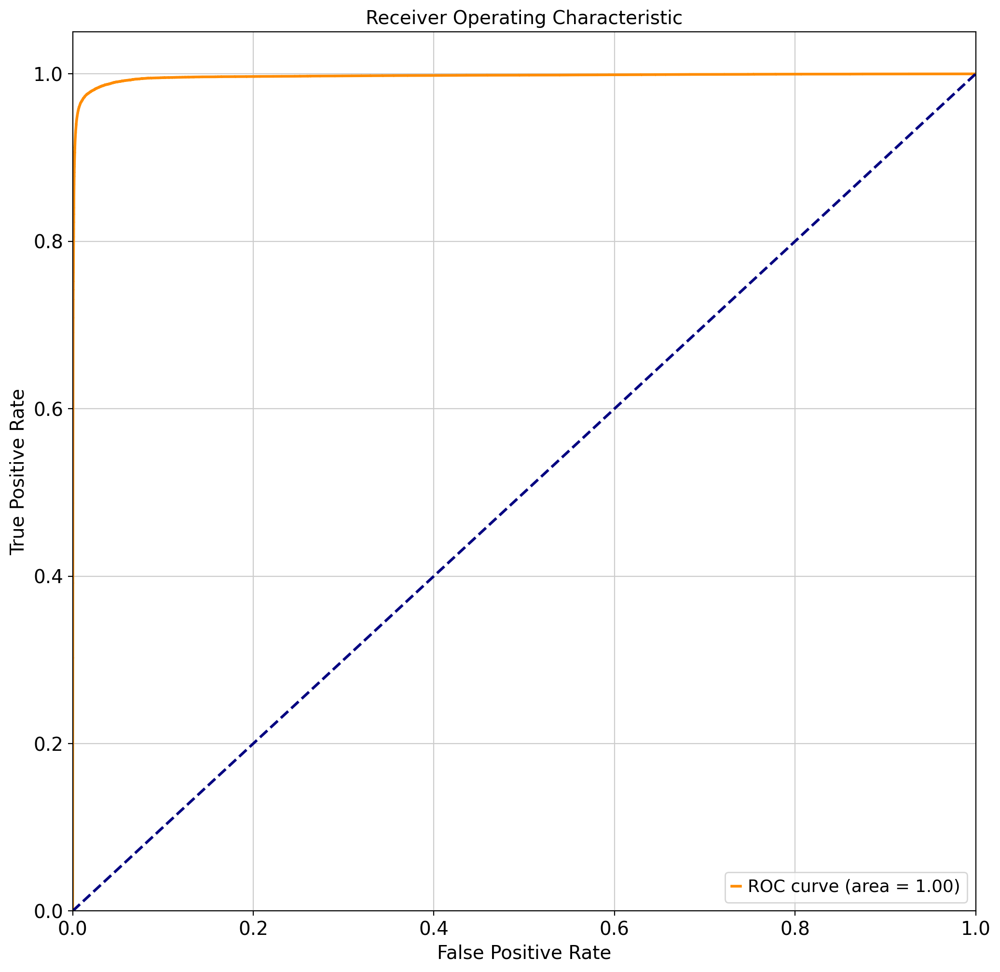

In [74]:
fpr, tpr, _ = roc_curve(ground_truth_encoded, predicted_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

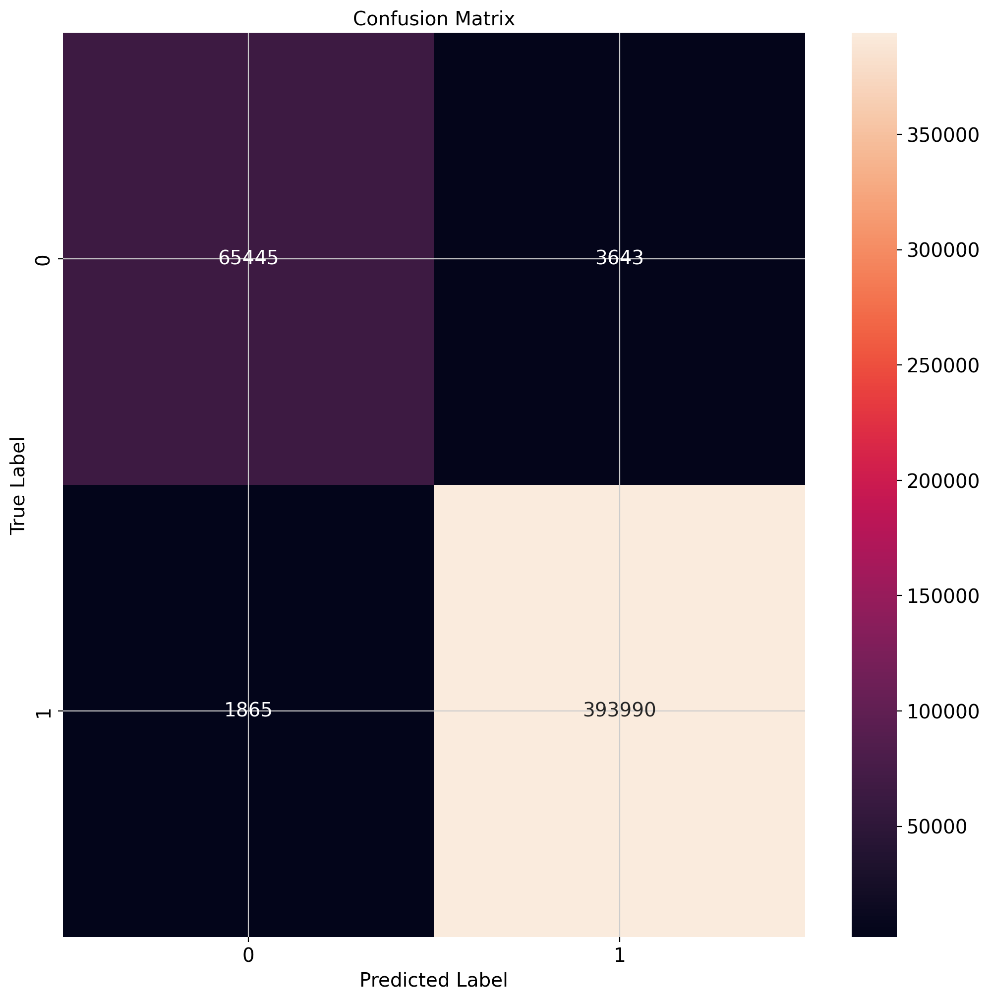

Precision-Recall AUC: 0.9372510526119491


In [75]:
conf_matrix = confusion_matrix(ground_truth, predicted)

sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)
pr_auc = auc(recall, precision)
print("Precision-Recall AUC:", pr_auc)

In [76]:
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_umap = adata[random_indices, :]

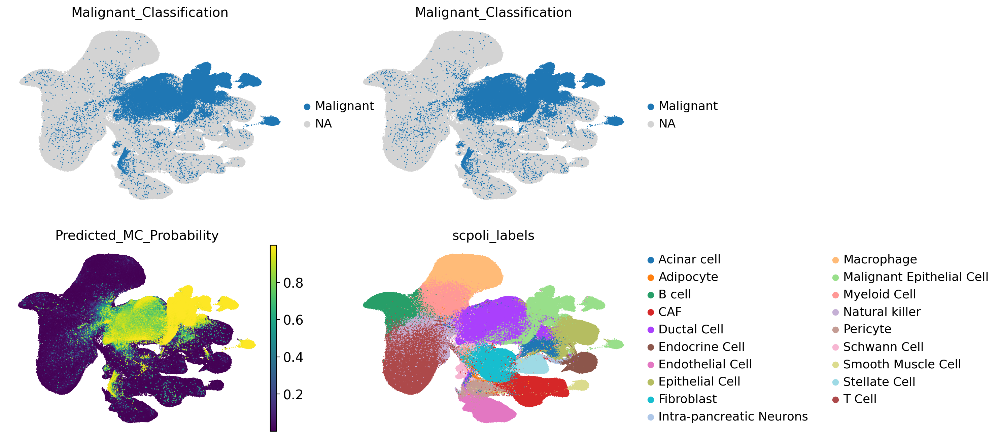

In [77]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(12, 8))
sc.pl.umap(adata_umap, color=['Malignant_Classification'], groups='Malignant', size=5, wspace=0.5, show=False, ax=ax1)
sc.pl.umap(adata_umap, color=['Malignant_Classification'], groups='Malignant', size=5, wspace=0.5, show=False, ax=ax2)
sc.pl.umap(adata_umap, color=['Predicted_MC_Probability'], size=5, wspace=0.5, ax=ax3, show=False)
sc.pl.umap(adata_umap, color=['scpoli_labels'], size=5, wspace=0.5, ax=ax4)

In [156]:
adata.write('/home/aih/shrey.parikh/PDAC/PDAC/Classifier/scpoli_int_donor_final.h5ad')

In [157]:
bst.save_model('/home/aih/shrey.parikh/PDAC/PDAC/Classifier/xgboost_model.json')